# Preprocessing and Quality Control of LC-MS Data with the nPYc-Toolbox

This tutorial demonstrates how to use the LC-MS data processing modules of the nPYc-Toolbox, to import and perform some basic preprocessing and quality control of LC-MS data, and to output a final high quality dataset ready for data modelling. It is based on the quality control criteria previously described in [Lewis et al. 2016](https://www.ncbi.nlm.nih.gov/pubmed/27479709).

Details of how to install all of the required dependencies and to set up your computing environment can be found here [Installing the nPYc-Toolbox](https://npyc-toolbox.readthedocs.io/en/latest/tutorial.html#Installing-the-nPYc-Toolbox).

The dataset used in this example (DEVSET U RPOS xcms) is comprised of six samples of pooled human urine, aliquoted, and independently prepared and measured by ultra-performance liquid chromatography coupled to reversed-phase positive ionisation mode spectrometry (LC-MS, RPOS). Each source sample was separately prepared and assayed thirteen times. A pooled QC sample (study reference, SR) and independent external reference (long-term reference, LTR) of a comparable matrix was also acquired to assist in assessing analytical precision. See [Tutorial Datasets](https://npyc-toolbox.readthedocs.io/en/latest/tutorial.html#tutorial-datasets) and the Metabolights Study [MTBLS694](https://www.ebi.ac.uk/metabolights/MTBLS694) for details of the study, and [Recommended Study Design Elements](https://npyc-toolbox.readthedocs.io/en/latest/studydesign.html) for details of the various QC samples acquired.

The [nPYc-toolbox-tutorials](https://github.com/phenomecentre/nPYc-toolbox-tutorials) contain all of the data required to run the tutorial Jupyter notebooks, full details of which are given [here](https://npyc-toolbox.readthedocs.io/en/latest/tutorial.html#preprocessing-and-quality-control-of-lc-ms-data-with-the-npyc-toolbox).

# 1. Import the nPYc-Toolbox and Configure the Jupyter Notebook

In [1]:
# Import the nPYc-Toolbox
import nPYc

# Import enumerations for sample type
from nPYc.enumerations import VariableType, DatasetLevel, AssayRole, SampleType

# Import normalisation objects for data normalisation
from nPYc.utilities.normalisation import NullNormaliser, TotalAreaNormaliser, ProbabilisticQuotientNormaliser

# Import matplotlib plotting, configure the Jupyter notebook to plot inline
import matplotlib.pyplot as plt
%matplotlib inline

# Set up plotly to work in offline mode with the notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

# Set up to hide warnings (particularly Depreciation, RunTime warnings, these are not for the user to worry about!)
# These lines can be commented to show warnings if of interest to advanced users
import warnings
warnings.filterwarnings(action='ignore')

import os
os.chdir('data/')

/home/suiram/Software/anaconda3/envs/week11/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning:

The sklearn.decomposition.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.decomposition. Anything that cannot be imported from sklearn.decomposition is now part of the private API.

/home/suiram/Software/anaconda3/envs/week11/lib/python3.7/site-packages/sklearn/utils/validation.py:71: FutureWarning:

Pass shuffle=True as keyword args. From version 0.25 passing these as positional arguments will result in an error

/home/suiram/Software/anaconda3/envs/week11/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning:

The sklearn.cross_decomposition.pls_ module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cross_decomposition. Anything that can

# 2. Import LC-MS Data

The next step is to import the LC-MS data into an nPYc-Toolbox [Dataset](https://npyc-toolbox.readthedocs.io/en/latest/objects.html) object.

The nPYc-Toolbox works on feature extracted LC-MS data, where the raw analytical data has been peak-picked into a one dimensional list of detected features, each of which is characterised by abundance and observed m/z and retention time. There are a number of peak-detection algorithms ([Spicer et al. 2017](https://www.ncbi.nlm.nih.gov/pubmed/28890673)), many of which are supported by the nPYc-Toolbox, however in this example, untargeted feature extraction was carried out using [XCMS](https://bioconductor.org/packages/release/bioc/html/xcms.html) [(Smith et al. 2006)](https://www.ncbi.nlm.nih.gov/pubmed/16448051).

In brief, the raw data files were first converted from .RAW format to .mzML format using the msConvert tool from the ProteoWizard tookit ([Chambers et al. 2012](https://www.ncbi.nlm.nih.gov/pubmed/23051804)), for feature-detection with XCMS. msconvert was configured to discard scans below an intensity threshold of 100 (--filter 'threshold absolute 100 most-intense'), and only retain scans from the first acquisition function (--filter 'scanEvent 1'). Subsequent peak detection by XCMS used the centwave algorithm configured with a noise threshold of 600, mass accuracy of 25ppm, and minimum and maximum peakwidth of 1.5 and 5 seconds. Feature grouping was performed using the 'density' method.

The LC-MS XCMS DevSet Dataset is located in 'DEVSET U RPOS xcms.csv', preceding the file path (in quotes) with the letter r ensures that the path is interpreted exactly as written.

The following line creates an object representing the dataset.

In [2]:
msData = nPYc.MSDataset(r'MTBLS946_features2.csv', fileType='XCMS', sop='GenericMS', noFeatureParams=8)

The “sop” parameter points to a configuration file (encoded in JSON format) which contains a set of parameters to use during data import and pre-processing, see [Configuration Files](https://npyc-toolbox.readthedocs.io/en/latest/configuration/configuration.html) for full details.

The default configuration file for LC-MS data, 'GenericMS', contains the recommended parameters for import and quality control of both human urine and plasma/serum data. For a list of all the parameters for MS data, see Table 5 in [Built-in Configuration SOPs](https://npyc-toolbox.readthedocs.io/en/latest/configuration/builtinSOPs.html).

If required, users can create new configuration files, or indeed amend the existing documents with their own values, however, any of the parameters present in these files can also be overwritten by passing values into the data import command directly, without having to modify or generate the configuration files themselves.

For LC-MS data, the majority of the parameters relate to preprocessing at the feature filtering stage, and therefore discussed in more detail below, but as an example, to change the threshold for filtering features based on residual standard deviation (RSD), the argument "rsdThreshold" can be overridden in the following manner:

```
msData = nPYc.MSDataset('DEVSET U RPOS xcms.csv', fileType='XCMS', sop='GenericMS', rsdThreshold=20)
```

Each nPYc-Toolbox Dataset object contains a name that can be changed as shown in the next cell. This name will be used in the summary and visualisation reports and in the file names of the exported data.

In [3]:
msData.name = 'MTBLS946 dataset'

# 3. Import Sample Metadata and Match to Acquired Data

The default way to add sample metadata is to prepare a CSV file which follows the set of conventions as described in [CSV Template for Metadata Import](https://npyc-toolbox.readthedocs.io/en/latest/samplemetadata.html#csv-template-for-metadata-import) and match it with the acquired data using the 'addSampleInfo' method.

Based on the corresponding entries in the sample metadata CSV file, the acquired samples are categorised into different types, where 'Study Samples (SS)' comprise the main core of the study, and the others are acquired for specific roles in characterising data quality. The main QC samples here are the 'Study Reference (SR)' samples, which comprise a pool of study samples and are used to assess analytical stability across the run, and the 'Long Term Reference (LTR)' samples, a QC sample external to the study. Additionally, the 'Serial Dilution (SRD)' samples are key for assessing linearity of response i.e. that features are measured accurately with respect to their true abundance. For interest we have also included a blank, for full details see [Recommended Study Design Elements](https://npyc-toolbox.readthedocs.io/en/latest/studydesign.html).

Although optional, this is recommended in order to make optimal use of the quality control features and visualisations provided by the nPYc-Toolbox.

An example CSV file is provided, as given in 'DEVSET U RPOS Basic CSV.csv':

In [4]:
msData.addSampleInfo(descriptionFormat='Basic CSV', filePath=r'MTBLS946_metainfo2.csv')

As described in [Datasets](https://npyc-toolbox.readthedocs.io/en/latest/objects.html), the spectral data, sample metadata and feature metadata can be inspected directly using:

```
dataset.intensityData
dataset.sampleMetadata
dataset.featureMetadata

```

In addition to the 'Basic CSV' format, it is also possible to extract analytical parameters directly from the raw data files. In this example, we have restricted data input to the sample metadata CSV file owing to the large file sizes of the raw LC-MS data files. However, if you would like to use this method for the tutorial dataset, the raw files can be downloaded directly from [MTBLS694](https://www.ebi.ac.uk/metabolights/MTBLS694) and the following used to match and extract the analytical parameters:

```
msData.addSampleInfo(descriptionFormat='Raw Data', filePath=r'/path to raw data files')
```

See [Analytical Parameter Extraction](https://npyc-toolbox.readthedocs.io/en/latest/samplemetadata.html#analytical-parameter-extraction) for more details.

In [5]:
msData.sampleMetadata

,Sample File Name,Metadata Available,Exclusion Details,Sample ID,SampleType,AssayRole,Dilution,Acquired Time,Run Order,Correction Batch,Class,Sample Base Name,Batch
0,QC_A_neg,True,None,QC_A_neg,Study Pool,Precision Reference,1,2020-04-15 01:00:00,1,1,QC,QC_A_neg,1
1,QC_A,True,None,QC_A,Study Pool,Precision Reference,1,2020-04-15 02:00:00,2,1,QC,QC_A,1
2,2_pre_M_A,True,None,2_pre_M_A,Study Sample,Assay,1,2020-04-15 03:00:00,3,1,Pre Surgery,2_pre_M_A,1
3,13_pre_M_A_neg,True,None,13_pre_M_A_neg,Study Sample,Assay,1,2020-04-15 04:00:00,4,1,Pre Surgery,13_pre_M_A_neg,1
4,8_pre_M_A,True,None,8_pre_M_A,Study Sample,Assay,1,2020-04-15 05:00:00,5,1,Pre Surgery,8_pre_M_A,1
5,10_pre_F_A_neg,True,None,10_pre_F_A_neg,Study Sample,Assay,1,2020-04-15 06:00:00,6,1,Pre Surgery,10_pre_F_A_neg,1
6,5_pre_M_A,True,None,5_pre_M_A,Study Sample,Assay,1,2020-04-15 07:00:00,7,1,Pre Surgery,5_pre_M_A,1
7,5_pre_M_A_neg,True,None,5_pre_M_A_neg,Study Sample,Assay,1,2020-04-15 08:00:00,8,1,Pre Surgery,5_pre_M_A_neg,1
8,9_pre_M_A_neg,True,None,9_pre_M_A_neg,Study Sample,Assay,1,2020-04-15 09:00:00,9,1,Pre Surgery,9_pre_M_A_neg,1
9,12_post_M_A,True,None,12_post_M_A,Study Sample,Assay,1,2020-04-15 10:00:00,10,1,Post Surgery,12_post_M_A,1


# 4. Generate Quality Control Reports

The nPYc-Toolbox offers a series of reports, pre-set visualisations comprised of text, figures and tables to describe and summarise the characteristics of the dataset, and help the user assess the overall impact of quality control decisions (i.e. excluding samples or features and changing filtering criteria). 

For full details see [Reports](https://npyc-toolbox.readthedocs.io/en/latest/reports.html).

### Sample Summary Report

The first report can be used to check the expected samples against those acquired, in terms of numbers, sample type, and any samples either missing from acquisition or not recorded in the sample metadata CSV file.

In [6]:
nPYc.reports.generateReport(msData, 'sample summary')

Summary of Samples Acquired


,Total,Marked for Exclusion
All,18,0
Study Sample,16,0
Study Reference,2,0


For example, for this dataset there are five samples with entries in the sample metadata CSV file, but missing from acquisition. This allows the user to quickly assess the completeness of the dataset and, for example, investigate why these samples were missing.

### Feature Summary Report

The feature summary report provides visualisations summarising the quality of the dataset with regards to quality control criteria previously described in [Lewis et al. 2016](https://www.ncbi.nlm.nih.gov/pubmed/27479709). These include both assessment of potential run-order and batch effects, and metrics by which feature quality can be assessed.

In order, these consist of:
- Feature abundances (Figure 1)
- Sum of total ion count, TIC (Figures 2 and 3)
- Correlation to dilution (Figures 4, 5 and 7)
- Residual standard deviation, RSD (Figures 5, 7 and 9)
- Chromatographic peak width, if available (Figure 8)
- Ion map (Figure 10)

For several of these parameters (for example, correlation to dilution, RSD), acceptable default values are pre-defined in the configuration SOP, see [Built-in Configuration SOPs](https://npyc-toolbox.readthedocs.io/en/latest/configuration/builtinSOPs.html). If different values are required, these can be set by the user in the SOP directly, or by updating the 'Attribute', either at import, or by subsequent direct modification in the pipeline (see [Datasets](https://npyc-toolbox.readthedocs.io/en/latest/objects.html) for more details).

For full details of each of the above, see [Feature Summary Report: LC-MS Datasets](https://npyc-toolbox.readthedocs.io/en/latest/reports.html#feature-summary-report-lc-ms-datasets)

Figure 1: Feature intensity histogram for all samples and all features in dataset (by sample type).


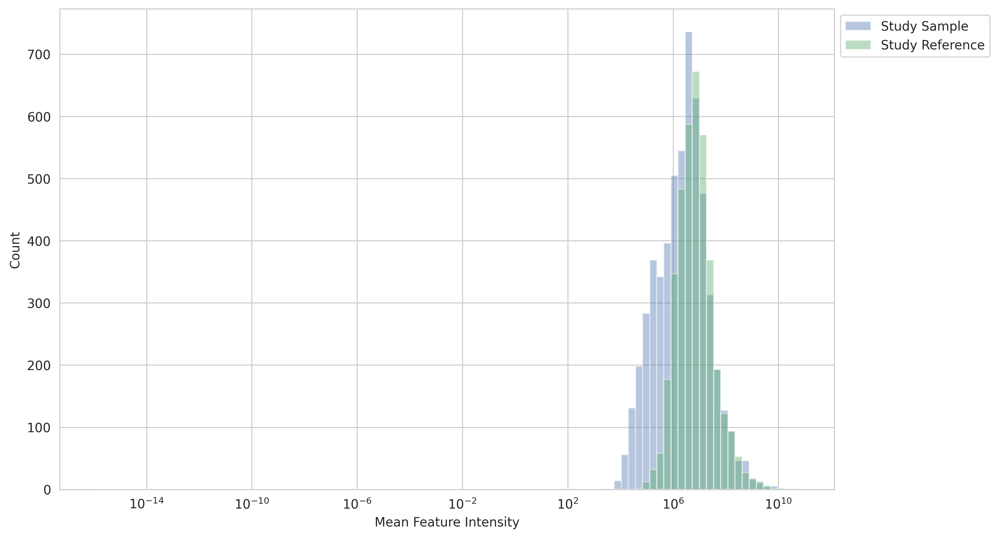

Figure 2: Sample Total Ion Count (TIC) and distribution (coloured by sample type).


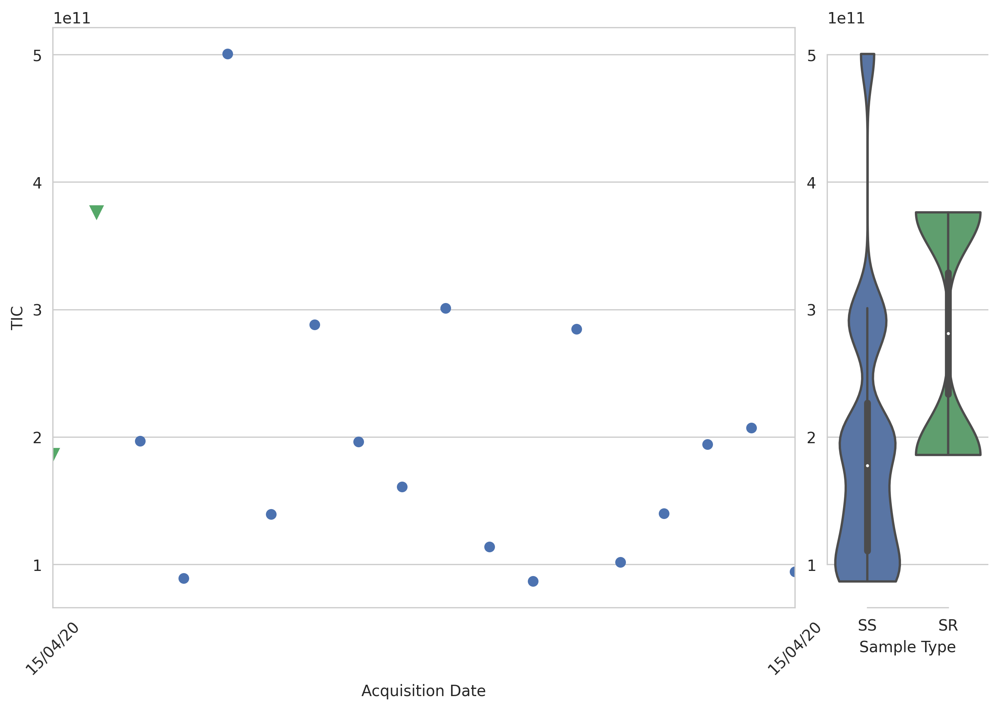

Figure 3: Acquisition structure (coloured by detector voltage).


KeyError: "['Detector'] not in index"

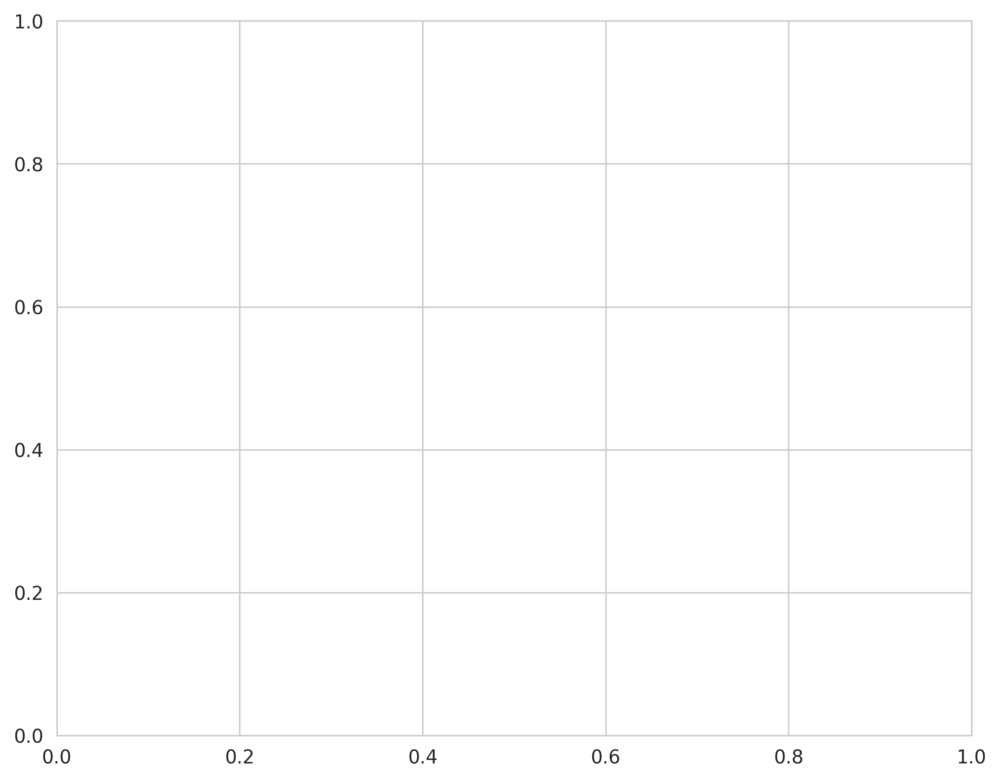

In [7]:
nPYc.reports.generateReport(msData, 'feature summary')

In general, for this dataset, the features are of reasonable intensity (Figure 1), and show the expected distributions in both correlation to dilution (Figure 4, positively skewed) and RSD (Figure 6, negatively skewed). Although there is a slight decrease in overall feature intensity over the course of the run (Figure 2) this is normal for LC-MS datasets, it is not associated with detector voltage (Figure 3), correction of this (by Batch and Run-Order Correction) will be addressed below. From the ion map (Figure 10) a large band of features can be seen at the very early retention times, these are in the solvent front and should be excluded (see below).

### Exporting Reports

By default all reports are output directly to the notebook (as above), however, if html copies are required these can be automatically saved to the save directory by adding the optional input argument "destinationPath".

For example, to save to the path defined in "saveDir":  

```
saveDir = '/path to save outputs'
nPYc.reports.generateReport(msData, 'feature summary', destinationPath=saveDir)

```

# 5. Assess Batch and Run-Order Effects and Apply Correction if Necessary

The nPYc-Toolbox provides a module specifically for detecting and correcting for per-feature run-order and batch effects in LC-MS datasets, by characterising the effect in reference samples and interpolating a correction factor to the intermediate samples. For full details see [Batch & Run-Order Correction](https://npyc-toolbox.readthedocs.io/en/latest/batchAndROCorrection.html).

In brief, for each feature, a LOWESS estimator is fitted on a series of consecutive study reference samples (with the default number of samples, "window=11") for each analytical batch (which can be defined by the user), and this fit used to correct all samples in the run (excluding SRD samples). Batch differences are corrected by aligning median feature intensities in the study reference samples between batches.

Initially, batch and run-order correction performance can be assessed on a subset of features prior to running on the whole dataset using the 'batch correction assessment' report:

Overall Total Ion Count (TIC) for all samples and features, coloured by batch.


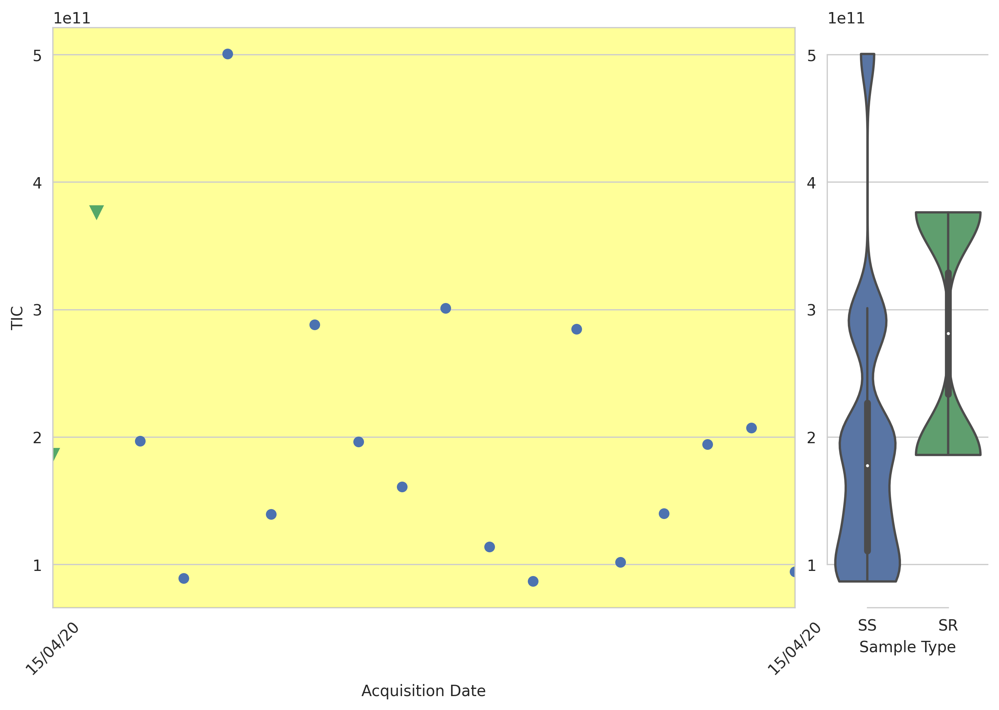

No StudyPool samples defined with AssayRole equal to LinearityReference
Example batch correction plots for a subset of features, results of batch correction with specified batches.
Feature 1032.72_519.825m-z


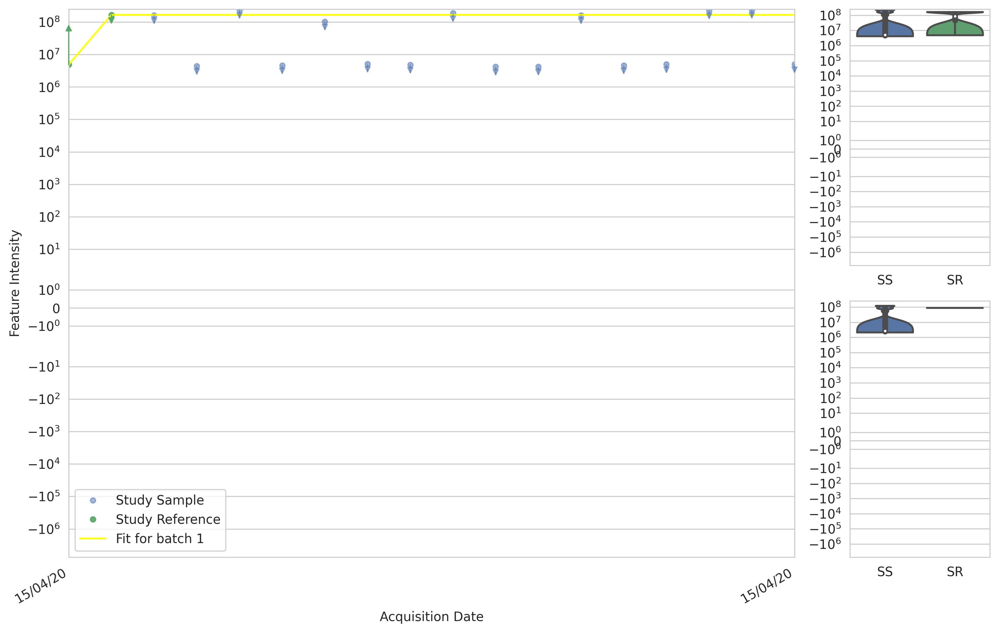

Feature 34.1_173.275m-z


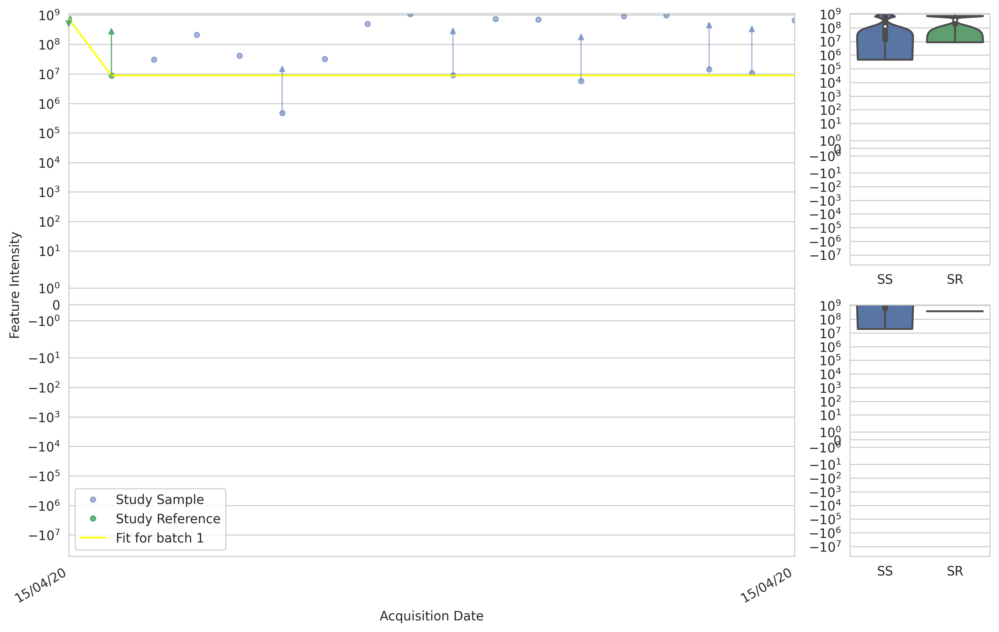

Feature 216.95_472.025m-z


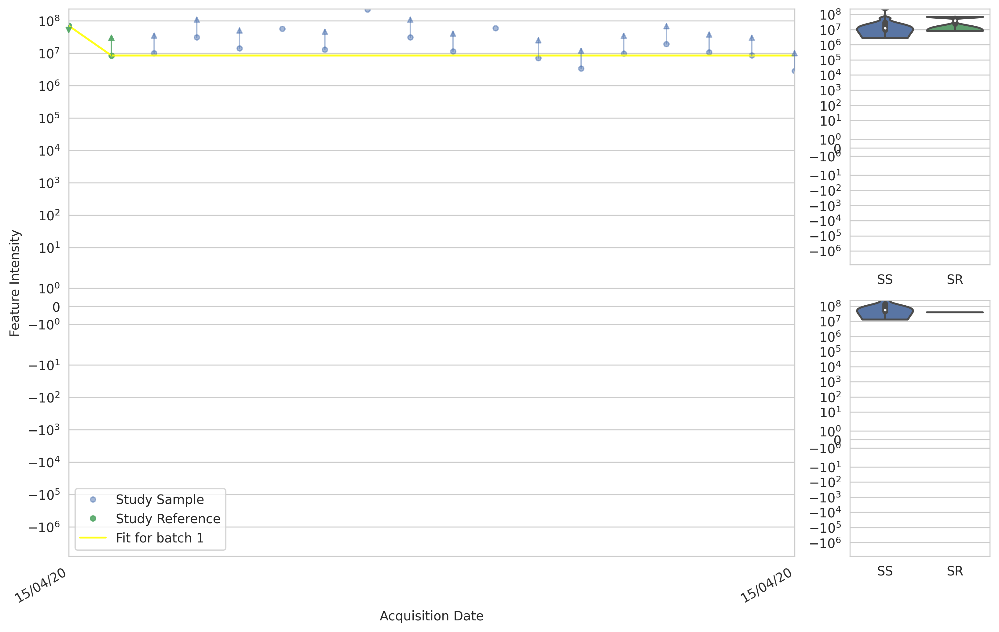

Feature 146.62_244.975m-z


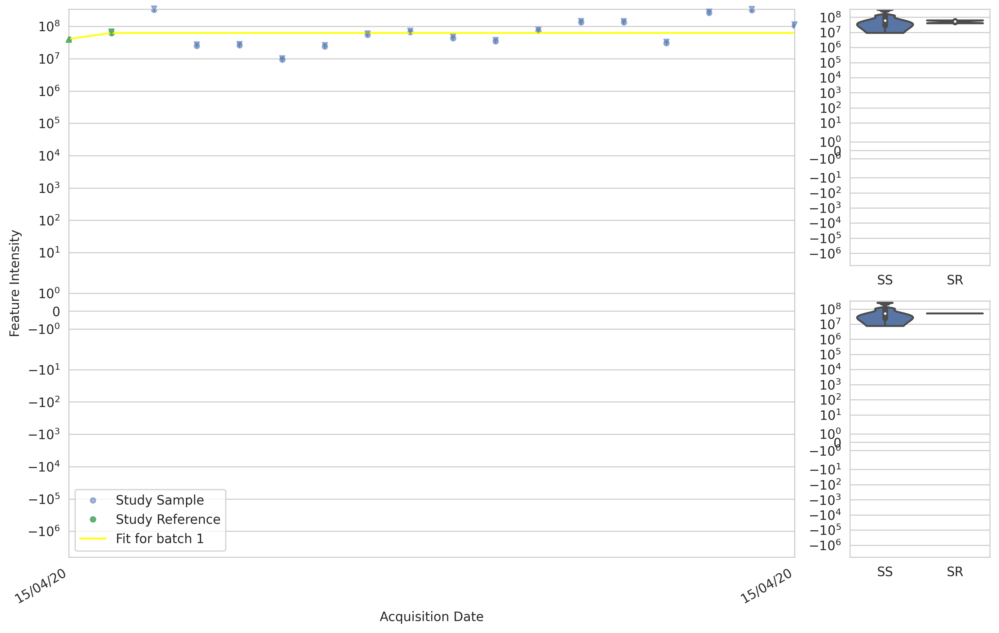

Feature 1018.66_579.575m-z


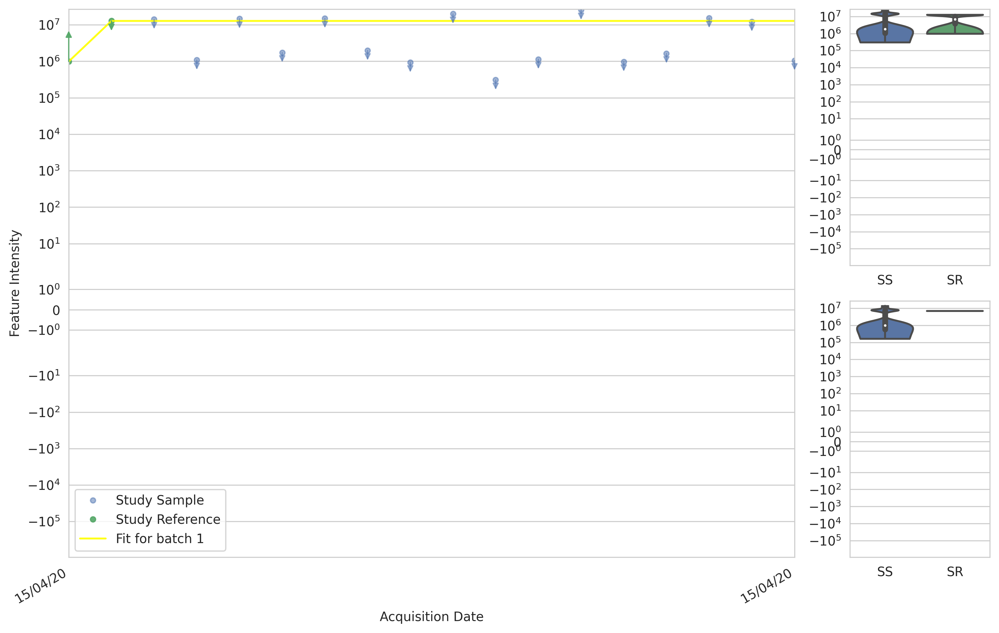

Feature 76.3_233.025m-z


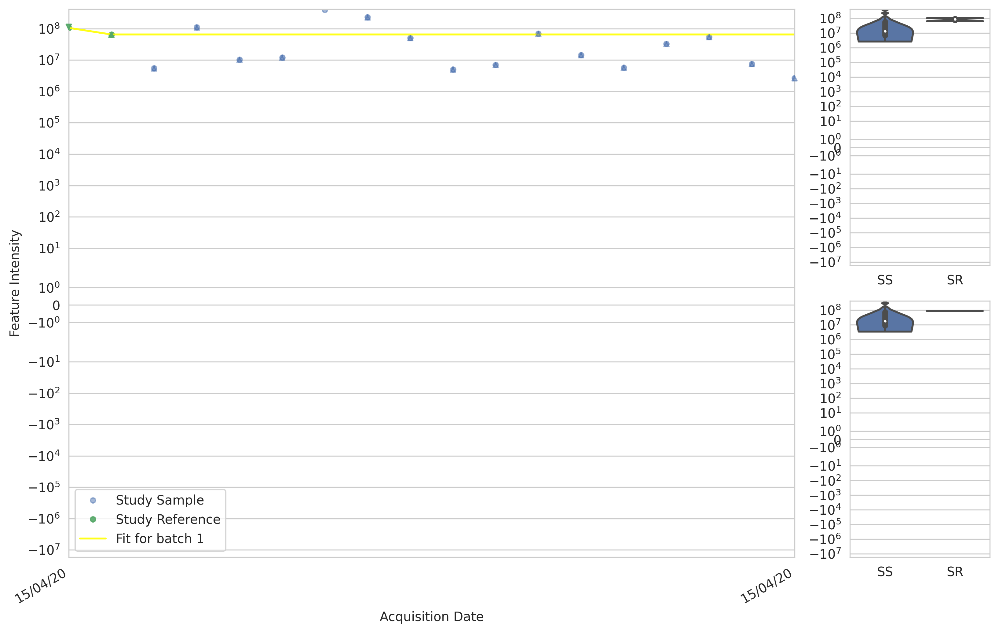

Feature 1215.56_615.425m-z


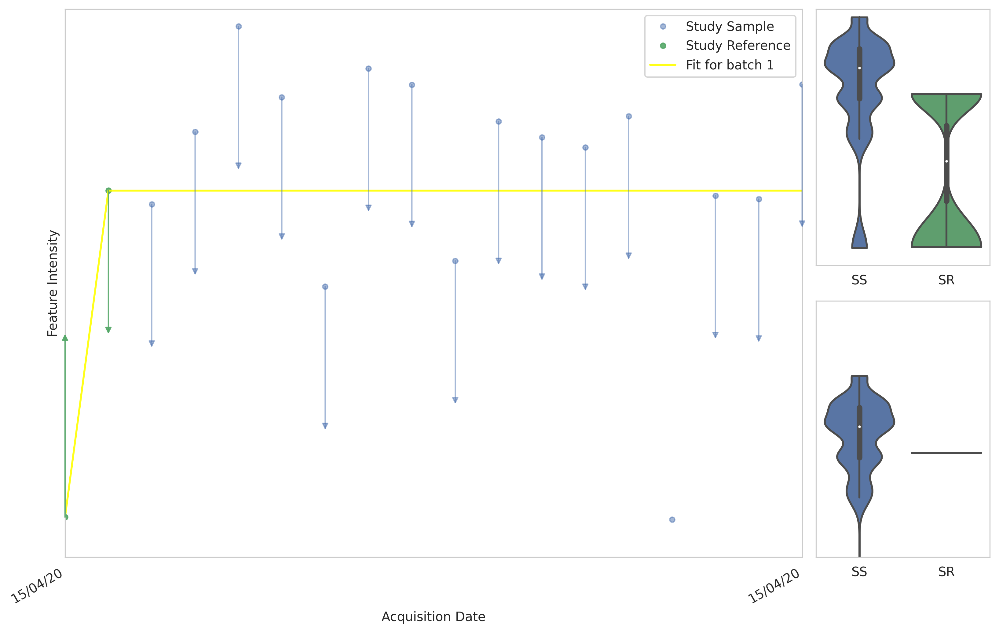

Feature 427.92_448.125m-z


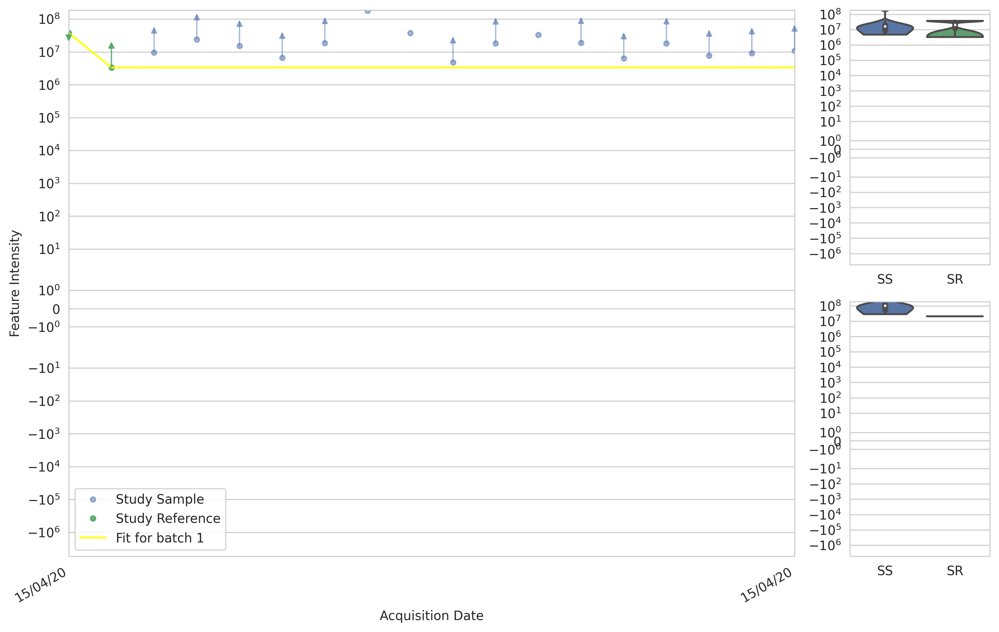

Feature 596.7_304.725m-z


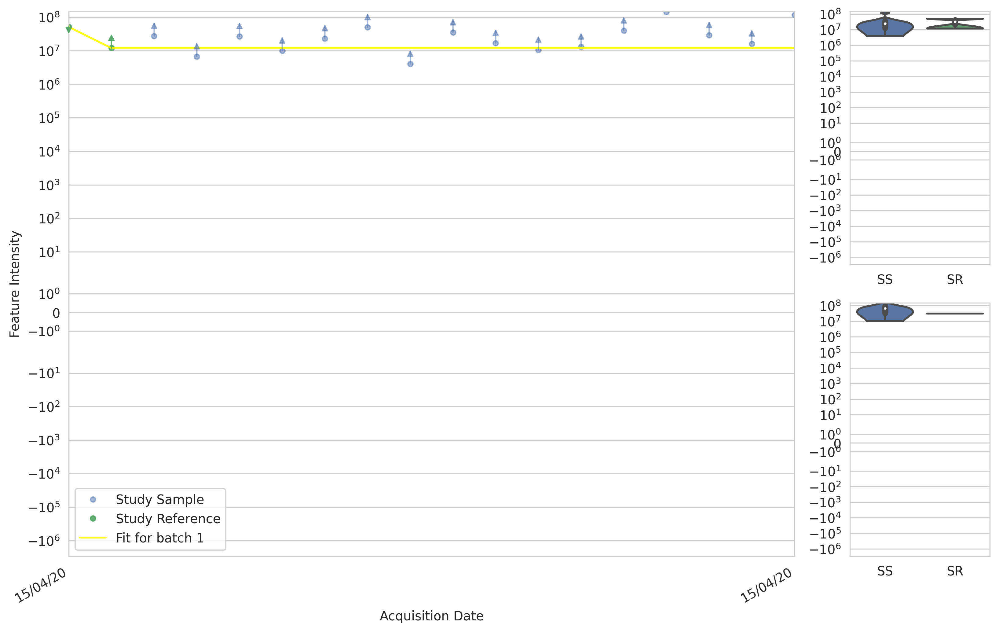

Feature 1088.98_352.525m-z


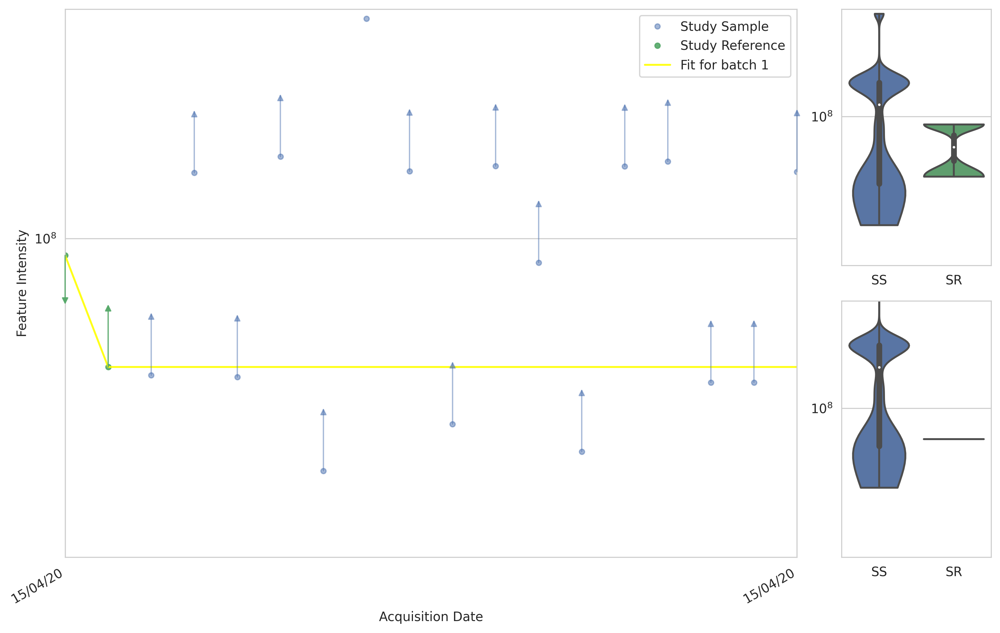

In [22]:
nPYc.reports.generateReport(msData, 'batch correction assessment')

By comparing the results across these surveyed features, the parameters for and necessity of correction can be assessed. As this is a critical step in preprocessing, here we give a full worked example of what to look for, there are four main questions which need to be addressed:

**1. Is the window of the LOWESS smoother appropriate?**

It is crucial that only broad and not narrow trends are being fitted, i.e. that the data is not being over-fitted. This can firstly be visualised by observing the fit of the LOWESS (yellow line) in the plots above, and secondly, by looking at the results post-correction using the 'batch correction summary' report.

The default window over which the LOWESS is fitted is 11 study reference (SR) samples. In the following, to illustrate the effects of over-fitting, we can generate a corrected dataset with "window=3":

In [23]:
msDatacorrected = nPYc.batchAndROCorrection.correctMSdataset(msData, window=1)

To assess the fit and performance of correction, the 'batch correction summary' report can then be generated using:

Figure 1: Feature intensity histogram for all samples and all features in dataset (by sample type).
Pre-correction.


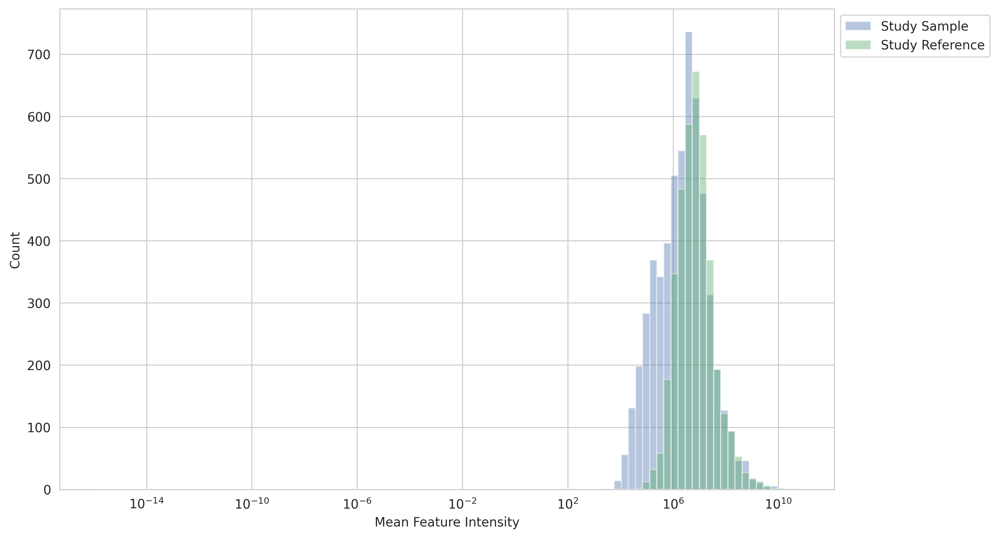

Post-correction.


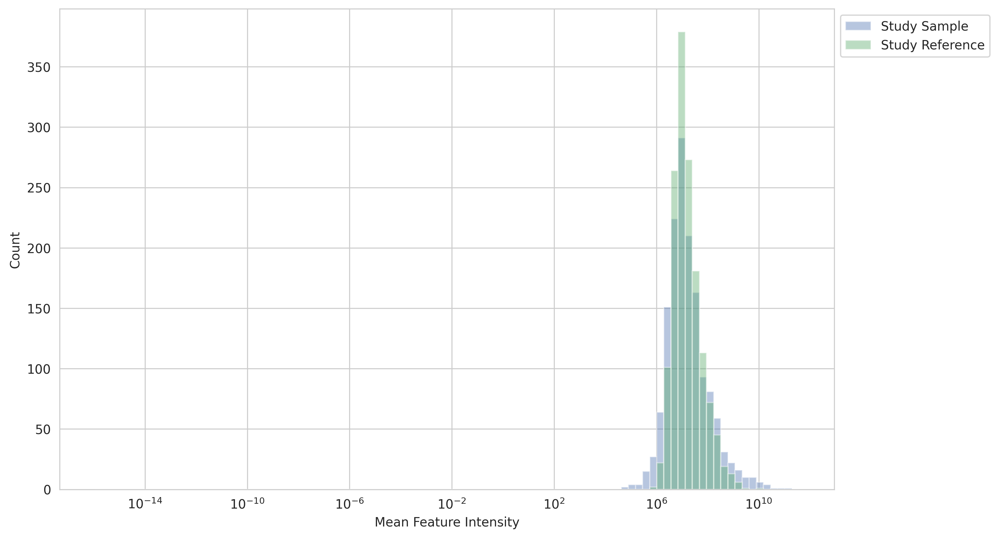

Figure 2: Sample Total Ion Count (TIC) and distribution (coloured by sample type).
Pre-correction.


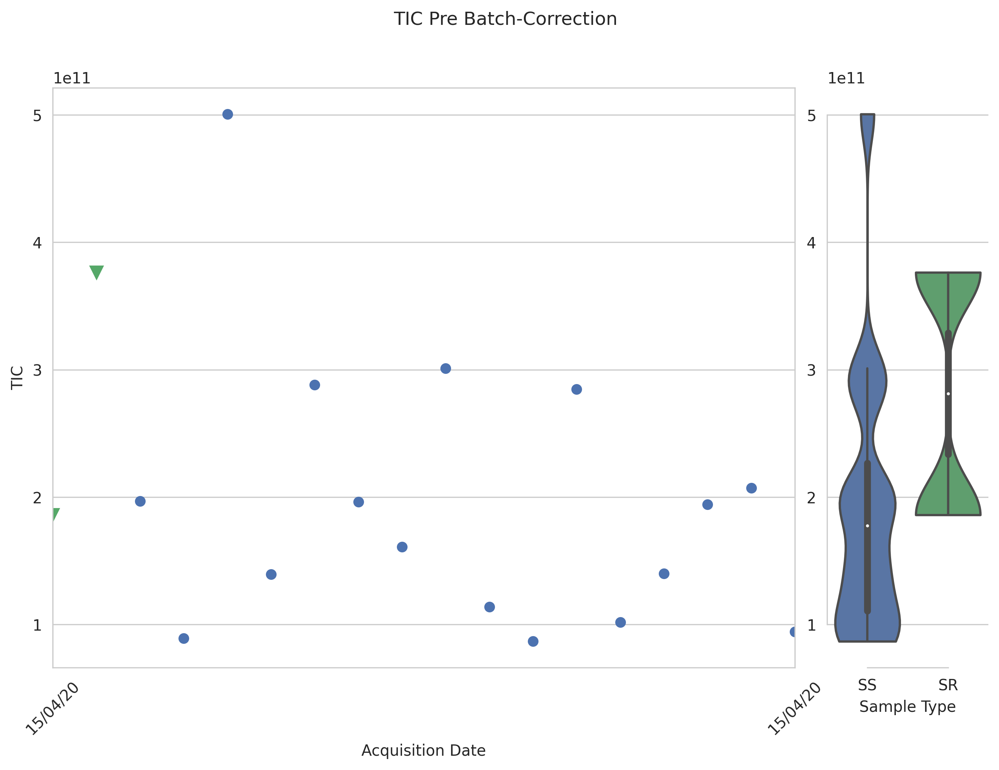

Post-correction.


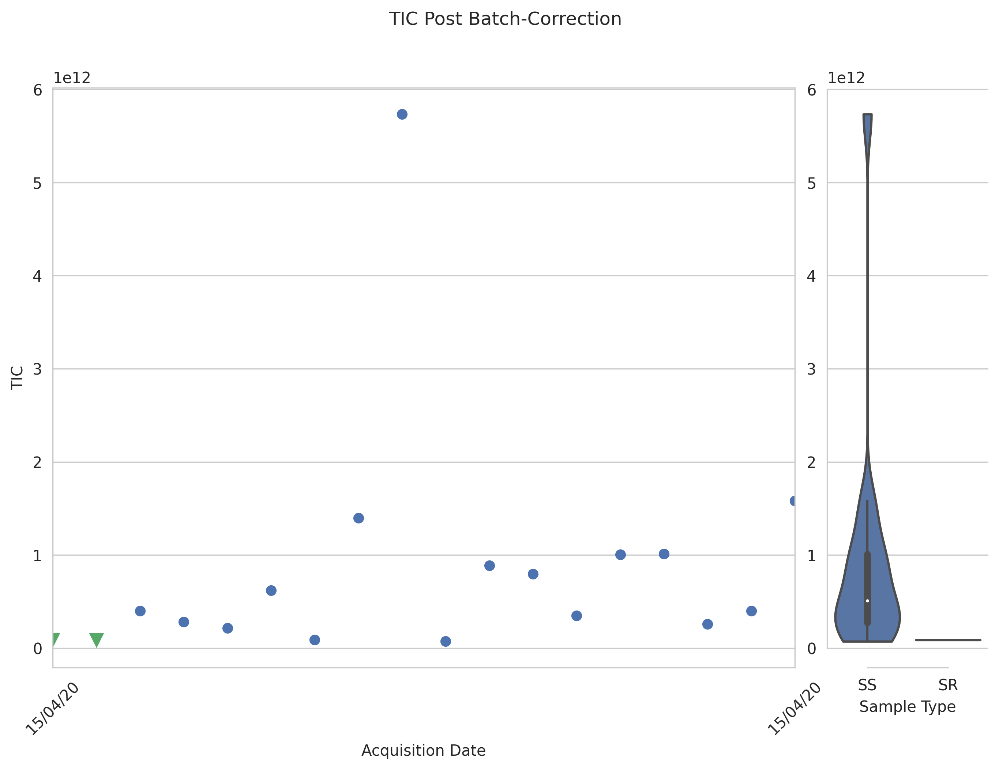

Figure 3: Histogram of Residual Standard Deviation (RSD) in study reference (SR) samples, segmented by abundance percentiles.
Pre-correction.


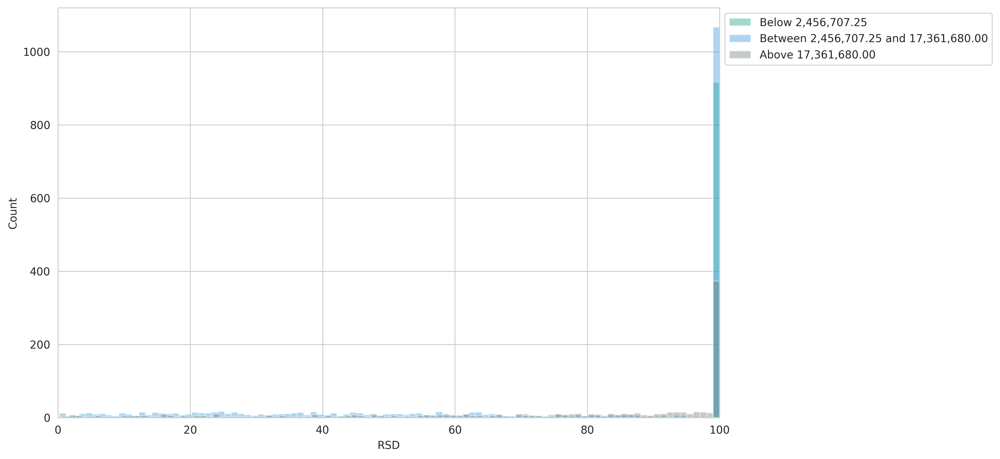

Post-correction.


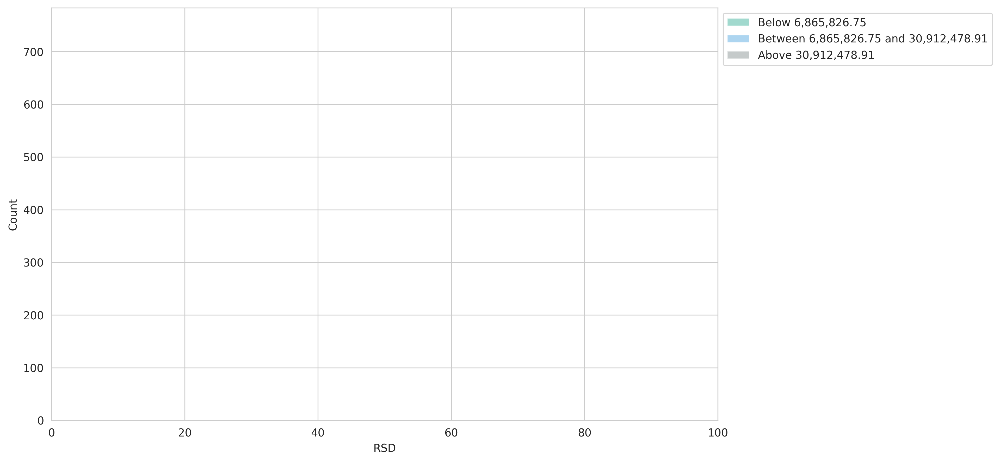

Figure 4: RSD distribution for all samples and all features in dataset (by sample type).
Pre-correction.


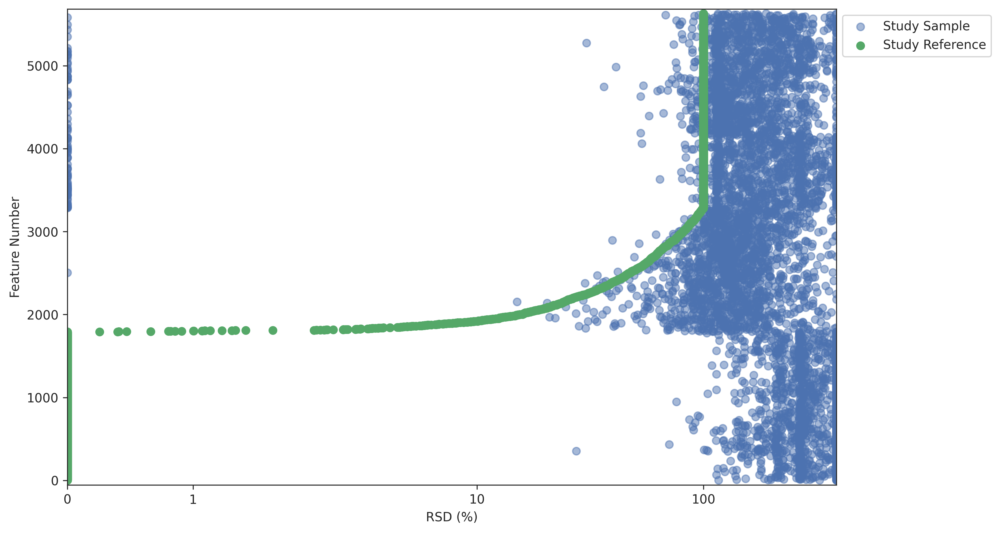

Post-correction.


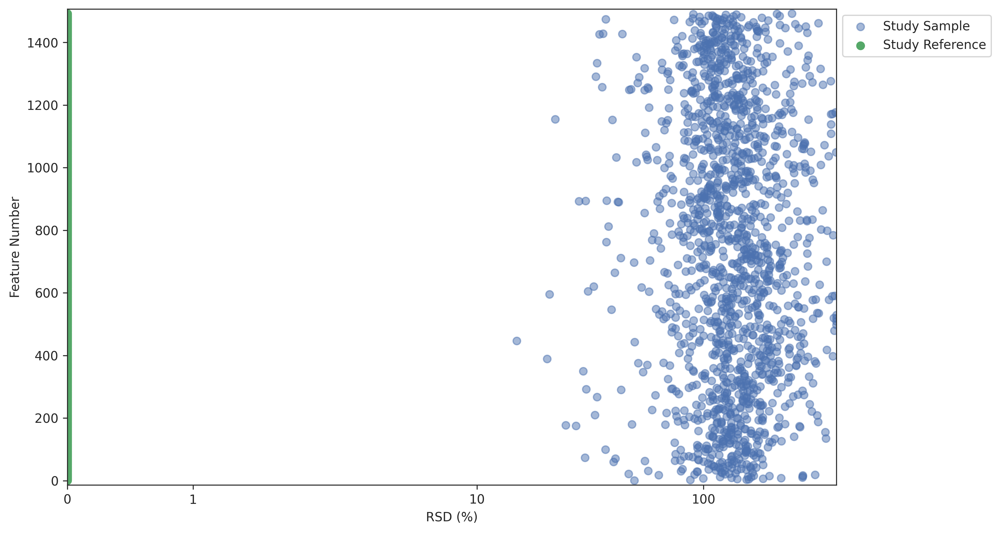

In [24]:
nPYc.reports.generateReport(msData, 'batch correction summary', msDataCorrected=msDatacorrected)

In terms of assessing over-fitting, the key figures here are Figures 2 and 4, in both of these, by comparing the pre-correction and post-correction plots it is clear that the relationship between the study reference and long-term reference samples has been completely skewed (in this case the RSD in SR samples post-correction (Figure 3) also cannot be calculated owing to the presence of zero values). The aim of correcting the data is to choose a window where any broad trends are corrected, but the local relationship between different sample types is maintained.

In [25]:
msDatacorrected = nPYc.batchAndROCorrection.correctMSdataset(msData)

As before, the 'batch correction summary' report can then be generated using:

Figure 1: Feature intensity histogram for all samples and all features in dataset (by sample type).
Pre-correction.


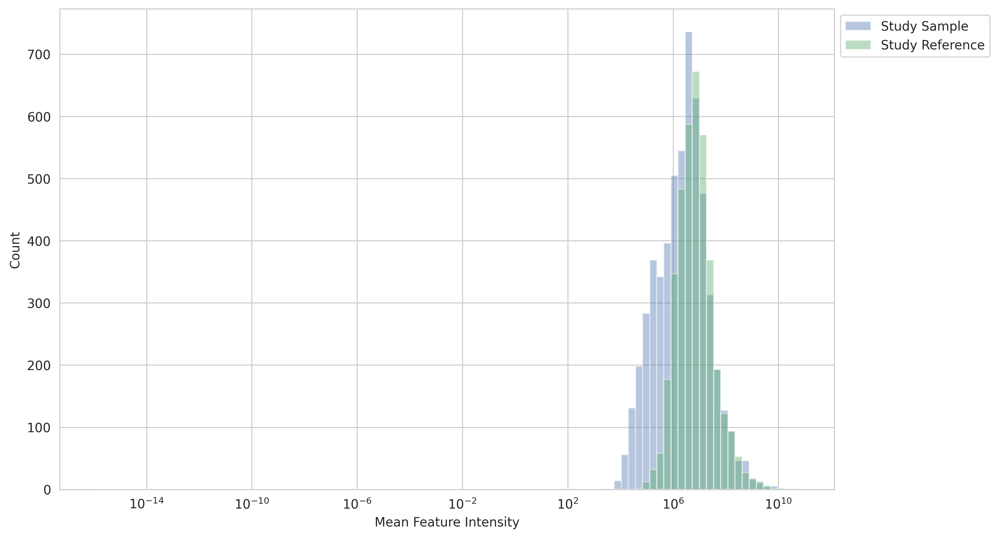

Post-correction.


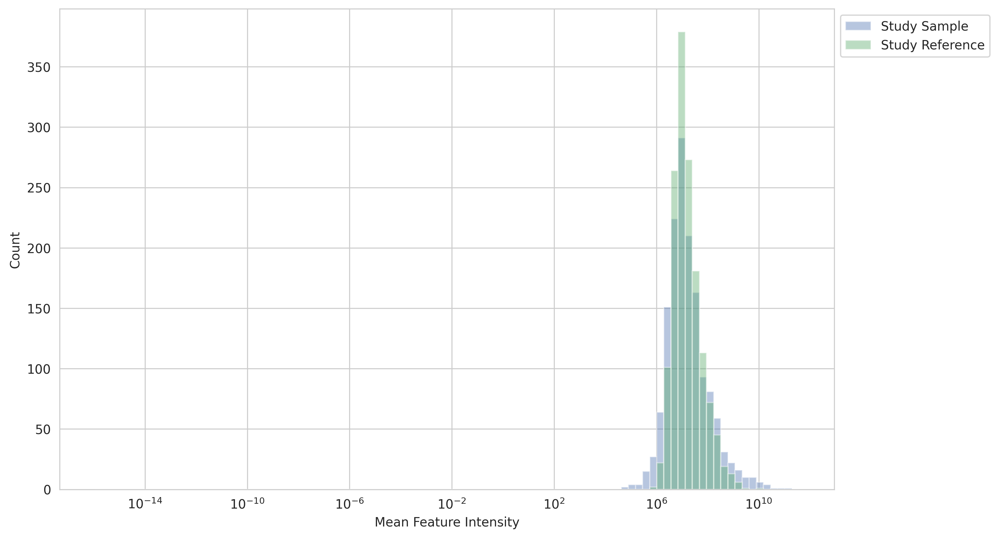

Figure 2: Sample Total Ion Count (TIC) and distribution (coloured by sample type).
Pre-correction.


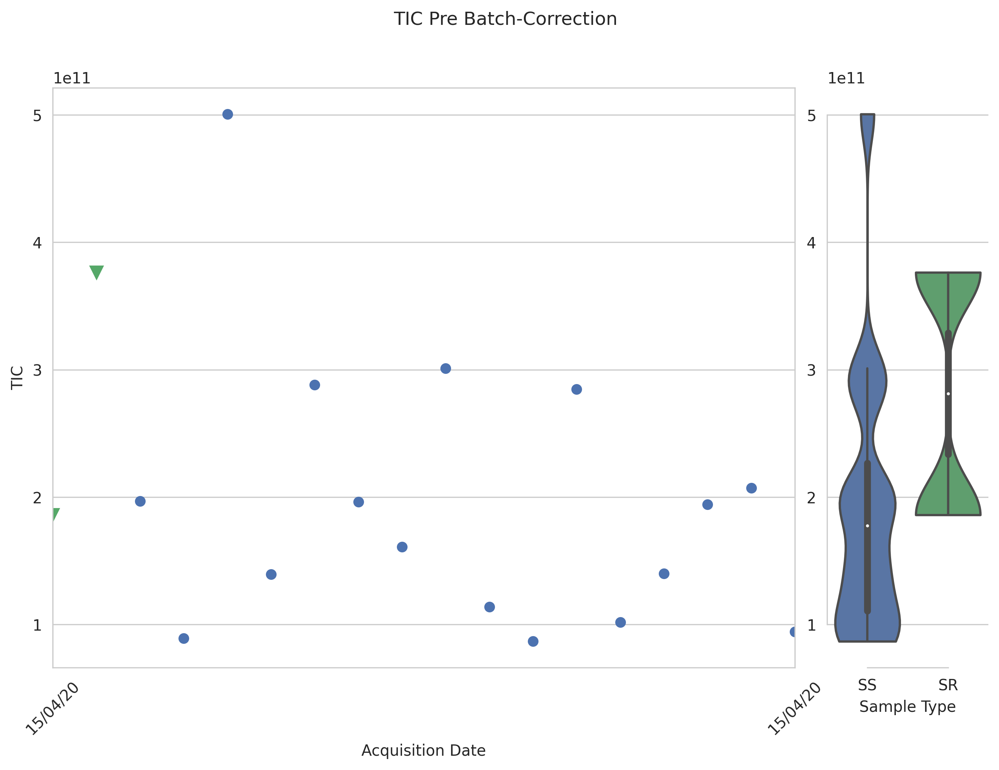

Post-correction.


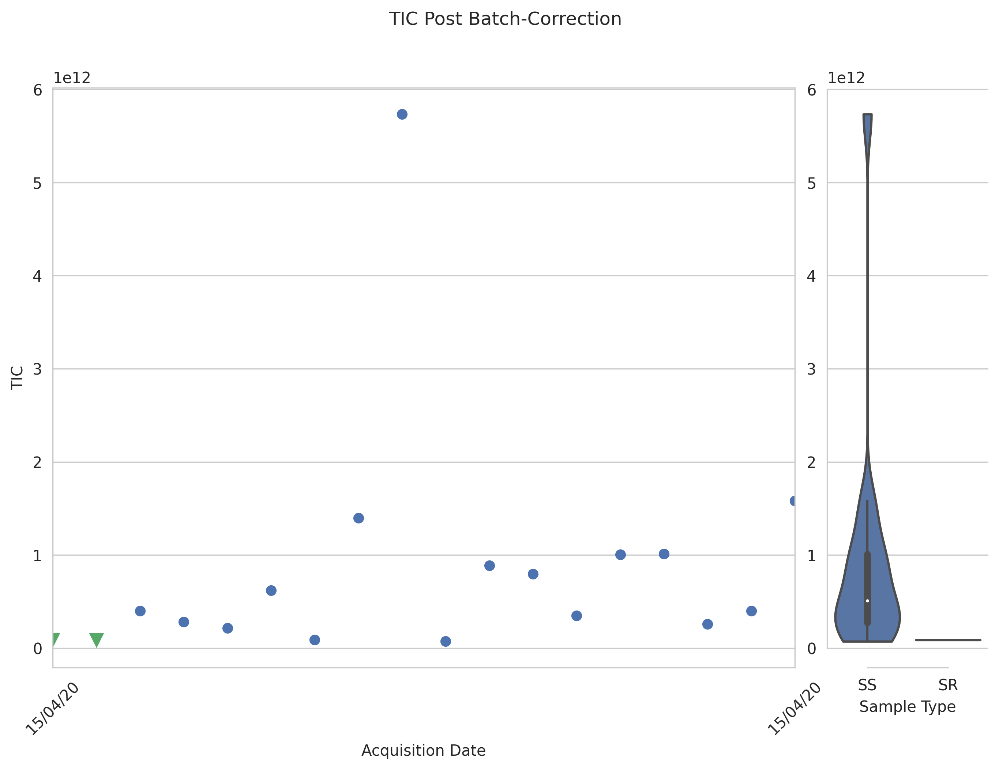

Figure 3: Histogram of Residual Standard Deviation (RSD) in study reference (SR) samples, segmented by abundance percentiles.
Pre-correction.


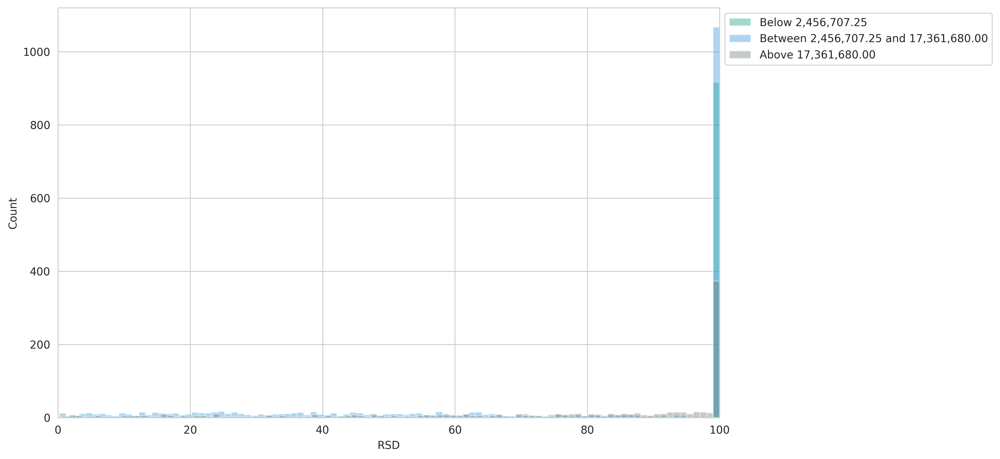

Post-correction.


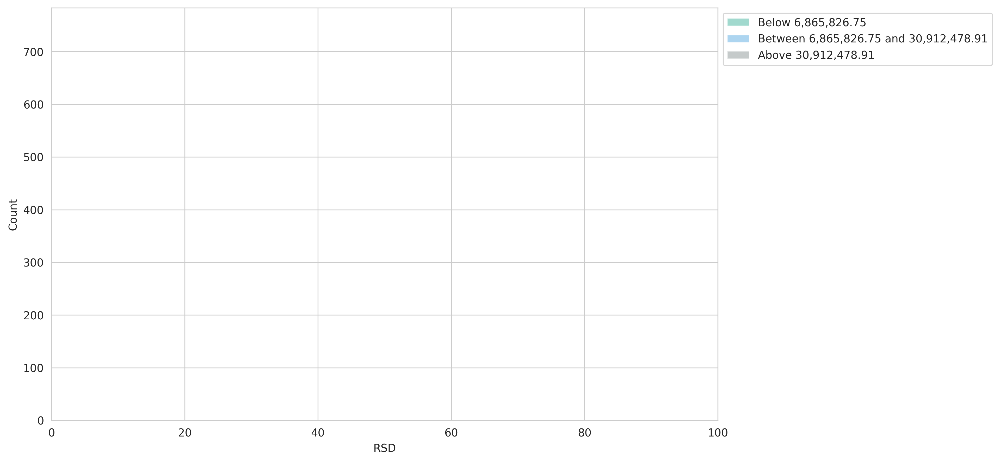

Figure 4: RSD distribution for all samples and all features in dataset (by sample type).
Pre-correction.


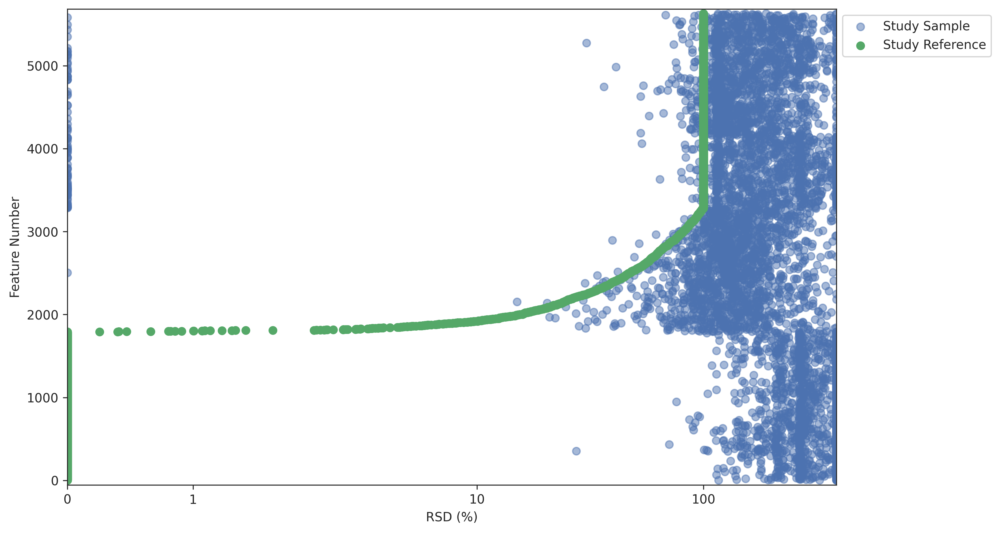

Post-correction.


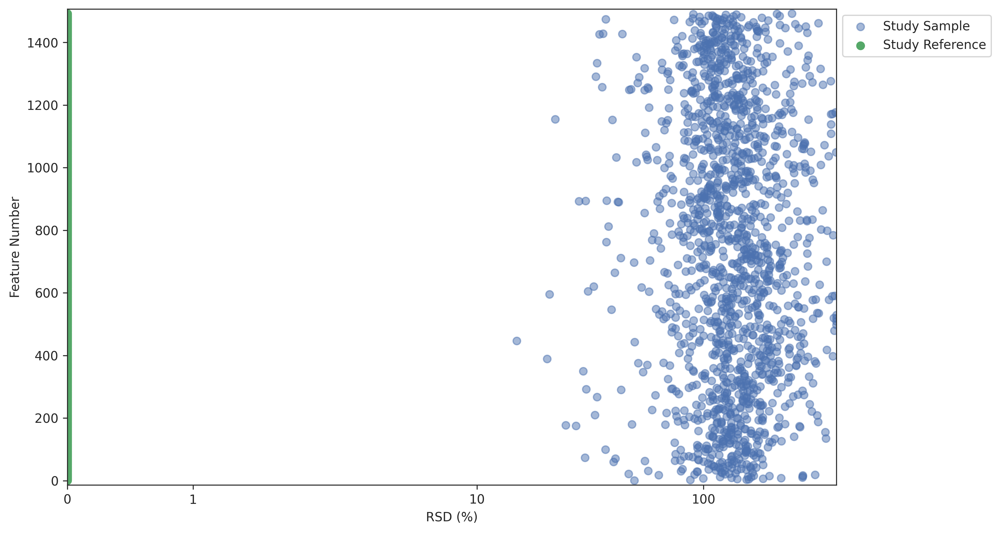

In [26]:
nPYc.reports.generateReport(msData, 'batch correction summary', msDataCorrected=msDatacorrected)

With the default parameters it can be seen that the relationship between the SR and LTR samples is conserved, but the gradual decline in overall intensity during the run is corrected.

# 6. Exclude Samples and/or Features if Required

Dataset objects contain two internal 'mask' vectors, the 'sampleMask' and 'featureMask', which store whether a sample or feature respectively should be used when calculating QC metrics, visualised in the reports and finally exported, see [Sample and Feature Masks](https://npyc-toolbox.readthedocs.io/en/latest/masks.html).

There are several functions which modify these masks, which are useful at various stages of quality control and in preparing a final dataset for export.

### Mask Features

For LC-MS datasets, features should be filtered based on their individual precision and accuracy to ensure that only high quality features are retained. 

The nPYc-Toolbox has been developed based on the quality control criteria previously described in [Lewis et al. 2016](https://www.ncbi.nlm.nih.gov/pubmed/27479709), and uses three key criteria for feature filtering, see [Sample and Feature Masks](https://npyc-toolbox.readthedocs.io/en/latest/masks.html):

1. Correlation to dilution (calculated from SRD samples), assess that features are measured accurately with respect to their true abundance
2. RSD (calculated from SR samples), assesses that features are measured precisely from multiple acquisitions of the same sample across the run
3. Comparing RSD in SR and SS, the variance in SS should always be greater than that seen in the SR samples

The distribution of correlation to dilution, and RSD can be visualised using the 'Feature Summary Report'.

A report summarising the number of features passing selection with different criteria can also be produced using: 

No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityRe

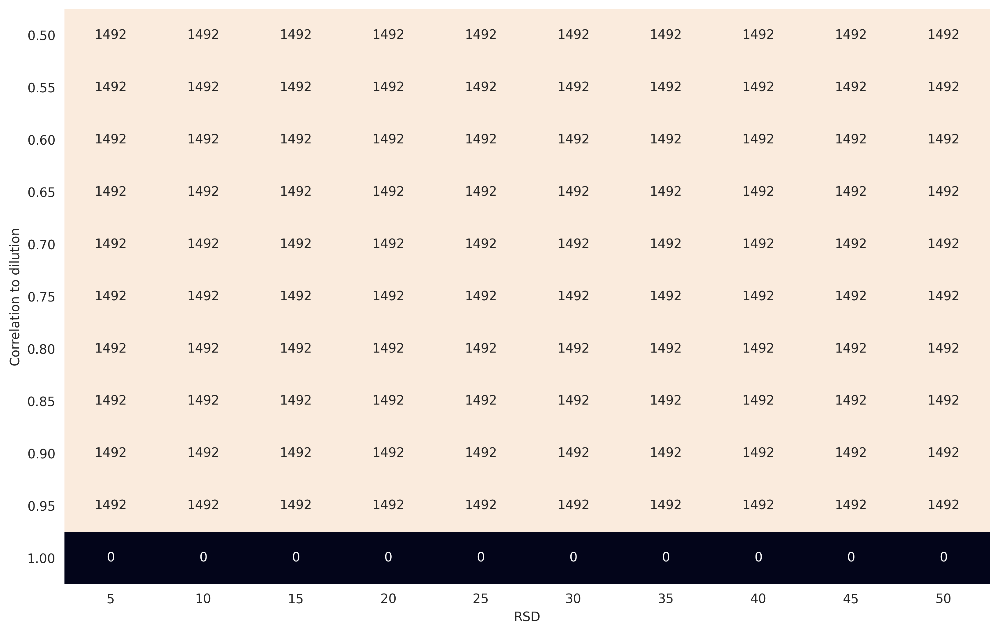

Summary of current feature filtering parameters and number of features passing at each stage

Number of features in original dataset: 5628

Features filtered on:
Correlation (pearson, exclusions: none) to dilution greater than 0.7: Not applied (no SRD samples present).
Relative Standard Deviation (RSD) in study reference (SR) samples below 30: 1492 passed selection.
RSD in study samples (SS) * 1.1 >= RSD in SR samples: 1492 passed selection.

Total number of features after filtering: 1492


In [15]:
nPYc.reports.generateReport(msDatacorrected, 'feature selection')

Using this report, the total number of features passing selection (with the default criteria) is 9920.

If more (or less) stringent criteria are required these can be set in the object 'Attributes', for example:

To amend the RSD threshold: 

```
msDatacorrected.Attributes['rsdThreshold'] = 20
```

Or to amend the correlation to dilution threshold:

```
msDatacorrected.Attributes['corrThreshold'] = .8
```

For more details and a full list of parameters see [Built-in Configuration SOPs](https://npyc-toolbox.readthedocs.io/en/latest/configuration/builtinSOPs.html).

Using the 'updateMasks' function, these criteria will be checked and the featureMask updated to mask those features not meeting the thresholds:

In [16]:
msDatacorrected.updateMasks(filterFeatures=True, filterSamples=False)

No StudyPool samples defined with AssayRole equal to LinearityReference
No StudyPool samples defined with AssayRole equal to LinearityReference


The results of masking can be visualised using the 'feature summary' report.

Using "withExclusions=True" means the report is generated as if any masked features were excluded from the dataset, which allows assessment of the results of filtering before the features are permanently excluded from the dataset.

Figure 1: Feature intensity histogram for all samples and all features in dataset (by sample type).


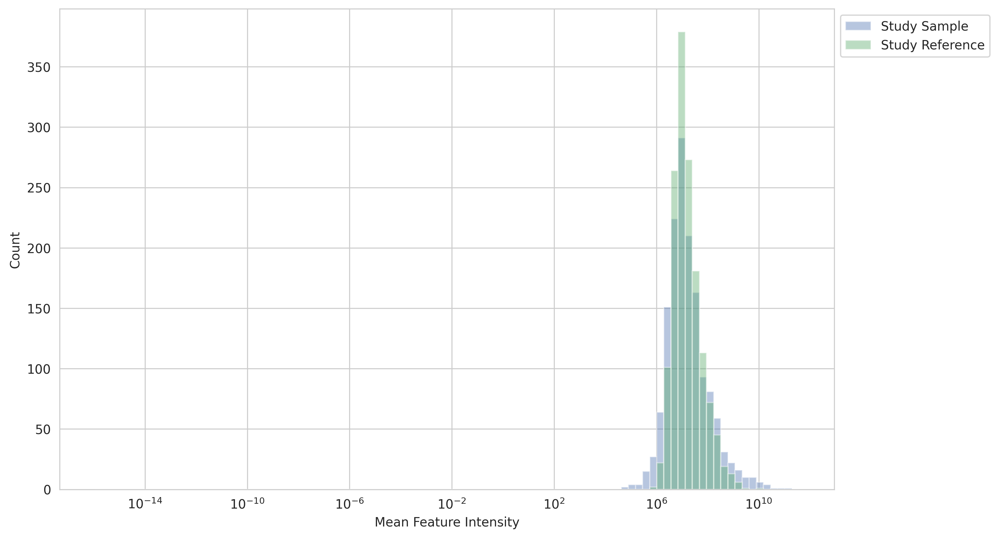

Figure 2: Sample Total Ion Count (TIC) and distribution (coloured by sample type).


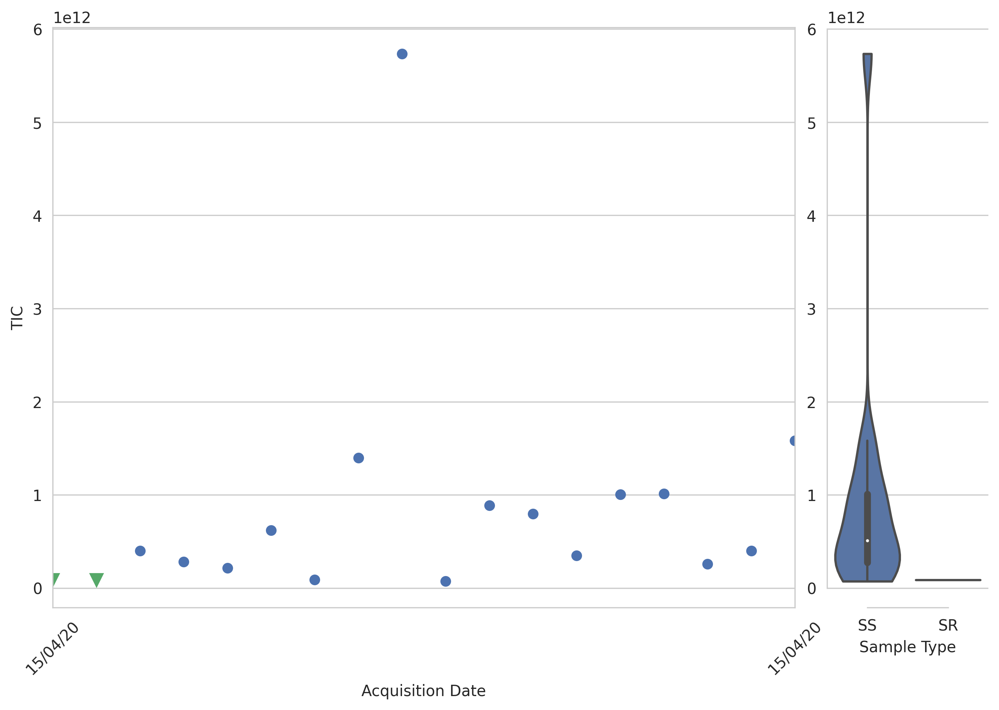

Figure 3: Acquisition structure (coloured by detector voltage).


KeyError: "['Detector'] not in index"

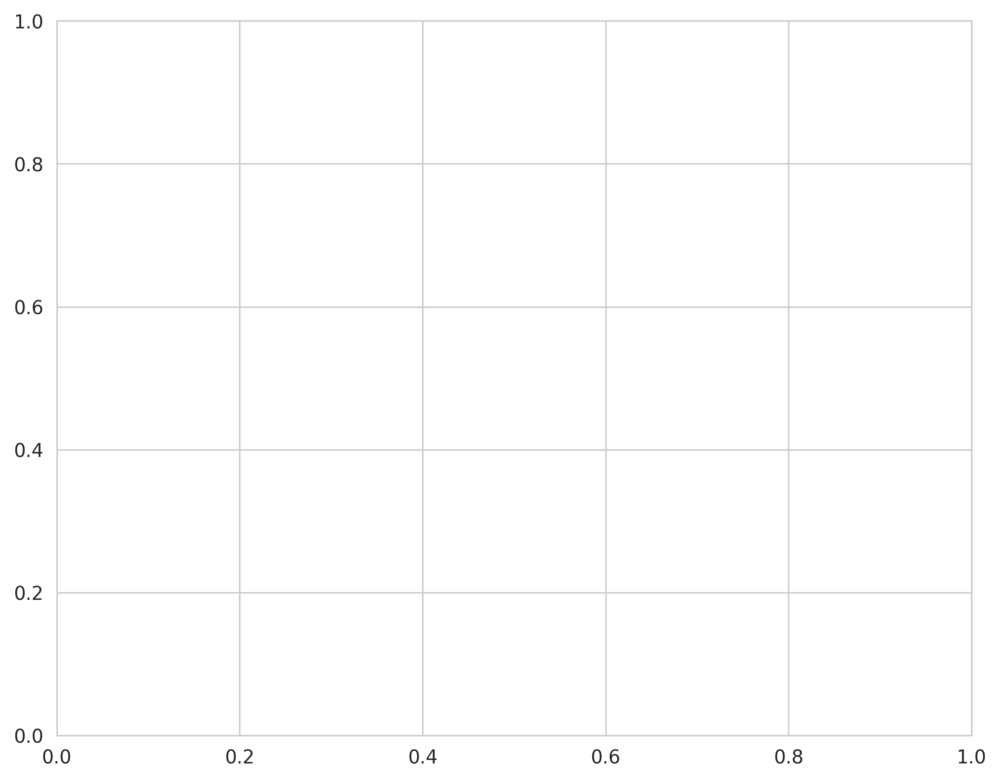

In [17]:
nPYc.reports.generateReport(msDatacorrected, 'feature summary', withExclusions=True)

### Permanently Exclude Masked Samples/Features

Once satisfied with the sample and feature masks, exclusions can be applied (permanently removed from the dataset) using the 'applyMasks' function.

This method should be used only when it is absolutely certain that the masked features and samples are to be removed, as the excluded data will otherwise have to be re-imported.

Before masks have been applied, however, feature/sample masking can be changed by first re-setting the masks to include all samples/features:

```
msDatacorrected.initialiseMasks() 
```

Then different feature/sample exclusions can be applied as required.

For details see [Sample and Feature Masks](https://npyc-toolbox.readthedocs.io/en/latest/masks.html)

In this case we are happy with the masking, and so features and samples can be permanently excluded using:

In [18]:
msDatacorrected.applyMasks()

# 7. Analytical Multivariate Quality Control

The nPYc-Toolbox provides the capacity to generate a principal component analysis (PCA) model of the data (via the [pyChemometrics](https://github.com/phenomecentre/pyChemometrics) module), and subsequently, to use this to assess data quality, identify potential sample and feature outliers, and determine any potential analytical associations with the main sources of variance in the data ([Multivariate Analysis](https://npyc-toolbox.readthedocs.io/en/latest/multivariate.html))

A PCA model can be generated using 'exploratoryAnalysisPCA', and there are a number of parameters which can be optimised depending on the dataset (see [PCA Model](https://npyc-toolbox.readthedocs.io/en/latest/multivariate.html#pca-model) for full details).

One key parameter is 'scaling', which divides each column in the data matrix by its respective standard deviation raised to a power of the scaling parameter. This parameter can range in value between 0 and 1, and recommended values are 0 for mean-centering only, 0.5 for Pareto scaling and 1 for unit variance (UV) scaling. The outcome of PCA model will vary based on the scaling method selected, and different scaling functions can be appropriate depending on the data itself and the question being asked of the data, see [van der Berg et al. 2006](https://www.ncbi.nlm.nih.gov/pubmed/16762068)

The default scaling is unit variance ("scaling=1"), which scales every variable to have a variance of one, and thus all variables (despite their different magnitudes) become equally important in the model.

Each model is cross-validated using 7-fold cross-validation and the recommended number of principal components automatically estimated based on two criteria, when either one of these is met no more components will be added and the PCA model will be returned. There criteria are:
1. "minQ2": Q2 is the variance predicted by each component (from cross-validation), when adding a component does not improve Q2 by at least this value (default "minQ2=0.05") then no more components will be added.
2. "maxComponents": this defines the maximum number of components (default "maxComponents=10") returned by the model (regardless of Q2 increases).

Again, these parameters can be amended by adding them as input arguments to 'exploratoryAnalysisPCA'.

In [20]:
PCAmodel = nPYc.multivariate.exploratoryAnalysisPCA(msData)

TypeError: check_array() got an unexpected keyword argument 'warn_on_dtype'

The analytical multivariate report provides visualisations summarising the largest sources of variance in the dataset (from the PCA model generated) with particular emphasis on any potential analytical sources, as defined in 'analyticalMeasurements' in the [Built-in Configuration SOPs](https://npyc-toolbox.readthedocs.io/en/latest/configuration/builtinSOPs.html).

These consist of:
- Scree plot of variance (Figure 1)
- Scores plots coloured by sample type (Figure 2)
- Strong sample outliers (Figure 3)
- DmodX sample outliers (Figure 4)
- Loadings plots (Figure 5)
- Distribution of analytical parameters (Figure 6)
- Heatmap of potential associations between analytical parameters and the main sources of variance (Figures 7 and 8)
- Scores plots coloured by analytical parameters with potential association (Figures 9-11)

For full details of each of the above, see [Multivariate Analysis Report](https://npyc-toolbox.readthedocs.io/en/latest/multivariate.html#multivariate-analysis-report)

In [21]:
nPYc.reports.multivariateReport(msData, PCAmodel)

NameError: name 'PCAmodel' is not defined

# 8. Finalise and Export Dataset

Subsequently, datasets can be exported in a variety of formats with the 'exportDataset' method (see [Exporting Data](https://npyc-toolbox.readthedocs.io/en/latest/exportingdata.html)).

By default datasets are exported to the current working directory, however, if files are required to be exported to a defined path, this can be done by adding the optional input argument "destinationPath".

For example, to save to the path defined in "saveDir":  

```
saveDir = '/path to save outputs'
msDatacorrected.exportDataset(saveFormat='UnifiedCSV', destinationPath=saveDir)

```

To export a single CSV file, which contains a row for every sample, and a column for every feature, alongside all of the sample and feature specific metadata, set "saveFormat=UnifiedCSV".

In [ ]:
msDatacorrected.sampleMetadata

In [27]:
msDatacorrected.exportDataset(saveFormat='UnifiedCSV', destinationPath='./corrected/')